# ODE Parameter Estimation

In this notebook we will explore how we can solve and learn the parameters of an ODE simultaneously using RxInfer. To illustrate how we can can utilize RxInfer, we will take Lotka-Volterra differential equation as an example. We will explore three different alternatives to parameter estimation. The first alternative will demonstrate how we can use free energy to obtain point estimates. The second alternative will demonstrate how we can use a prior distribution on the parameters to obtain a posterior estimate for the unknown parameters of the ODE. The second alternative will do parameter learning in two stages. The first stage will obtain the initialization for the prior hyper-parameters and then use these initial values of the prior to obtain the posterior by message passing. The third alternative will use purely message passing. 

In [1]:
using RxInfer, Optim, LinearAlgebra, Plots,  StaticArrays, StableRNGs

## Introduction to Lotka-Volterra Equations

The Lotka-Volterra equations, are a pair of first-order nonlinear differential equations frequently used to describe the dynamics of biological systems in which two species interact: one as a predator and the other as prey. The equations are defined as follows:

Prey Population Dynamics:
  $$\frac{dx}{dt} = \alpha x - \beta xy$$
  
Predator Population Dynamics:
  $$\frac{dy}{dt} = -\gamma y + \delta xy$$

In this ODE, $x$ is the population of the prey (e.g., rabbits), $y$ is the population of the predator (e.g., foxes), $\alpha$ represents the maximum growth rate of the prey, $\beta$ is the rate of predation, $\gamma$ is the predator's per capita death rate and $\delta$ is the growth rate of the predator population based on the availability of prey.

In [4]:
function lotka_volterra(u, z, p, t)
    α, β, δ, γ = p[SA[1,2,3,4]]
    x, y = u[SA[1, 2]]
    du1 = α * x - β * x * y
    du2 = -δ * y + γ * x * y

    return [du1, du2]
end;

## The Runge-Kutta 4th Order (RK4) Method

The Runge-Kutta 4th order method is one of the most widely used numerical techniques for solving ordinary differential equations (ODEs). For a system of the form:

$$\frac{dx}{dt} = f(x, t)$$

where $x$ can be a scalar or vector-valued function, RK4 provides a numerical approximation with local truncation error of order $O(h^5)$ and global error of order $O(h^4)$.

### Algorithm

Given the current state $x_n$ at time $t_n$, RK4 computes the state at $t_{n+1} = t_n + dt$ using four intermediate evaluations:

$$\begin{aligned}
k_1 &= f(x_n, t_n) \\
k_2 &= f(x_n + \frac{dt}{2}k_1, t_n + \frac{dt}{2}) \\
k_3 &= f(x_n + \frac{dt}{2}k_2, t_n + \frac{dt}{2}) \\
k_4 &= f(x_n + dt\,k_3, t_n + dt)
\end{aligned}$$

The solution is then advanced using a weighted average of these evaluations:

$$x_{n+1} = x_n + \frac{dt}{6}(k_1 + 2k_2 + 2k_3 + k_4)$$


In [5]:
function rk4_step(f::Function, x, u, θ, t, dt; supersample = 1)
    
    @inbounds for i in 1:supersample
        dt_i = dt/supersample
        k1 = f(x, u, θ, t)
        k2 = f(x + dt_i/2*k1, u, θ, t + dt_i/2)
        k3 = f(x + dt_i/2*k2, u, θ, t + dt_i/2)
        k4 = f(x + dt_i*k3, u, θ, t + dt_i)
        x += dt_i/6*(k1 + 2*k2 + 2*k3 + k4)
    end
    return x

end

function lotka_volterra_rk4(x, θ, t, dt, supersample = 1)
    return rk4_step(lotka_volterra, x, 0, θ, t, dt)
  
end

lotka_volterra_rk4 (generic function with 2 methods)

# Data Generation

Lotka Volterra data is generated using the RK4 method. The data is then corrupted with noise to simulate real-world observations. 

DISCLAIMER: Since Lotka-Volterra equations model prey and predator dynamics, adding a Gaussian noise is not realistic. Although adding other noise forms are possible it will complicate the inference process. Therefore, we will use Gaussian noise for instructive purposes. 

In [6]:
function generate_data(θ; x = ones(2), t =0.0, dt = 0.001, n = 1000, v = 1, seed = 123)
    rng = StableRNG(seed)
    data = Vector{Vector{Float64}}(undef, n)
    ts = Vector{Float64}(undef, n)
    for i in 1:n
        data[i] = lotka_volterra_rk4(x, θ, t, dt)
        x = data[i]
        t += dt
        ts[i] = t
    end
    noisy_data = map(data) do d
        noise = sqrt(v) * [randn(rng), randn(rng)]
        d + noise
    end
    return data, noisy_data, ts
end

dt = 0.1 # sample_interval
noisev = 0.35
n = 10000
true_params = [1.0, 1.5, 3.0, 1.0]
data_long, noisy_data_long, ts_long = generate_data(true_params,dt = dt, n = n, v = noisev);

## We create a smaller dataset for the global parameter optimization. Utilizing the entire dataset for the global optimization will take too much time. 
n_train = 100
data = data_long[1:n_train]
noisy_data = noisy_data_long[1:n_train]
ts = ts_long[1:n_train];


# Data Visualization

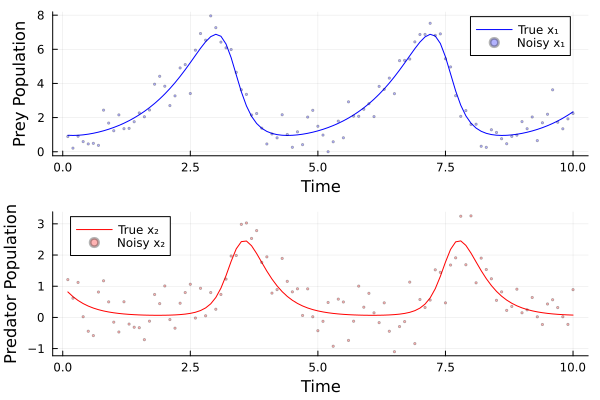

In [7]:
p = plot(layout=(2,1))
plot!(subplot=1, ts, [d[1] for d in data], label="True x₁", color=:blue)
plot!(subplot=1, ts, [d[1] for d in noisy_data], seriestype=:scatter, label="Noisy x₁", color=:blue, alpha=0.3, markersize=1.3)
plot!(subplot=2, ts, [d[2] for d in data], label="True x₂", color=:red)
plot!(subplot=2, ts, [d[2] for d in noisy_data], seriestype=:scatter, label="Noisy x₂", color=:red, alpha=0.3, markersize=1.3)
xlabel!("Time")
ylabel!(subplot=1, "Prey Population")
ylabel!(subplot=2, "Predator Population")


# First Alternative: Global Parameter Optimization 

In the first alternative we will construct one time-segment of Lotka-Volterra equation. We will use `lotka_volterra_rk4` function to create non-linear node. This function was defined earlier to numerically solve the Lotka-Volterra equations using the 4th order Runge-Kutta method. 

In [8]:
@model function lotka_volterra_model_without_prior(obs, mprev, Vprev, dt, t, θ)
    xprev ~ MvNormalMeanCovariance(mprev, Vprev)
    x     := lotka_volterra_rk4(xprev, θ, t, dt)
    obs   ~ MvNormalMeanCovariance(x,  noisev * diageye(length(mprev)))
end

Non-linear deterministic nodes require meta specification that will determine the type of message approximations to be used. In this case, we can use the `Linearization` method that will trigger an Extended Kalman Filter (EKF) type of approximation or the `Unscented` method that will trigger an Unscented Kalman Filter (UKF) type of approximation. Moreover, because we are using RxInfer in an online setting we need to specify how the mean and covariance of the Gaussian distribution will be updated. We do this by using the `@autoupdates` macro and initialize using the `@initialization` macro. 

In [13]:
delta_meta = @meta begin
    lotka_volterra_rk4() ->  Linearization()
end

autoupdates_without_prior = @autoupdates begin
    mprev, Vprev= mean_cov(q(x))
end

@initialization function initialize_without_prior(mx, Vx)
    q(x) = MvNormalMeanCovariance(mx, Vx)
end;

# Free Energy Computation
We will now define the free energy function that will be minimized to infer the parameters of the model. Since the parameters of the model are not constrained to be positive, we will use the `exp` function to transform the parameters to the positive domain. We will set the free energy to true to keep track of the free energy values. 

In [14]:
function compute_free_energy_without_prior(θ ; mx = ones(2), Vx = 1e-6 * diageye(2))
    θ = exp.(θ)
    result = infer(
        model = lotka_volterra_model_without_prior(dt = dt, θ = θ),
        data = (obs = noisy_data, t= ts),
        initialization = initialize_without_prior(mx, Vx),
        meta = delta_meta,
        autoupdates = autoupdates_without_prior,
        keephistory = length(noisy_data),
        free_energy = true
    )
    return sum(result.free_energy_final_only_history)
end;

Now we are ready to perform the parameter inference by minimizing the free energy function. We will use the `optimize` function from the `Optim` package to perform the optimization. We will use the `NelderMead` method as the optimizer as it doesn't require gradient information and is faster.

In [15]:
res_without_prior  = optimize(compute_free_energy_without_prior, zeros(4), NelderMead(), Optim.Options(show_trace = true, show_every = 300));

Iter     Function value    √(Σ(yᵢ-ȳ)²)/n 
------   --------------    --------------
     0     1.274436e+03     9.650180e+00
 * time: 0.00015091896057128906


In [16]:
θ_minimizer_without_prior = exp.(res_without_prior.minimizer)
println("\nEstimated point mass valued parameters:")
for (i, (name, val)) in enumerate(zip(["α", "β", "γ", "δ"], θ_minimizer_without_prior))
    println(" * $name: $(round(val, digits=3))")
end

println("\nActual parameters used to generate data:")
for (i, (name, val)) in enumerate(zip(["α", "β", "γ", "δ"], true_params))
    println(" * $name: $(round(val, digits=3))")
end


Estimated point mass valued parameters:
 * α: 0.994
 * β: 1.491
 * γ: 3.054
 * δ: 0.997

Actual parameters used to generate data:
 * α: 1.0
 * β: 1.5
 * γ: 3.0
 * δ: 1.0


# Second Alternative: RxInfer Model with Prior on the Parameters

We will now define the corresponding RxInfer model with the prior distribution on the parameters. For this, we will use the `@model` macro to create a time segment for the ODE using the deterministic ODE solver `lotka_volterra_rk4` as a non-linear node in the RxInfer model. For the prior distribution of the parameters, we will use a multivariate Gaussian distribution with mean `mθ` and covariance `Vθ` that will be initialized using the `initialize` macro.


In [17]:
@model function lotka_volterra_model(obs, mprev, Vprev, dt, t, mθ, Vθ)
    θ     ~ MvNormalMeanCovariance(mθ, Vθ)
    xprev ~ MvNormalMeanCovariance(mprev, Vprev)
    x     := lotka_volterra_rk4(xprev, θ, t, dt)
    obs   ~ MvNormalMeanCovariance(x,  noisev * diageye(length(mprev)))
end

In [18]:
autoupdates = @autoupdates begin
    mprev, Vprev= mean_cov(q(x))
    mθ, Vθ = mean_cov(q(θ))
end

@initialization function initialize(mx, Vx, mθ, Vθ)
    q(x) = MvNormalMeanCovariance(mx, Vx)
    q(θ) = MvNormalMeanCovariance(mθ, Vθ)
end;


# Prior Initialization by means of Free Energy Minimization

We will now define the free energy function that will be minimized to infer the initial hyper-parameters of the prior distribution. Since we have 4 parameters, we will initialize the mean of the prior distribution with 4 elements and the diagonal elements of the covariance matrix. Again, we will use the `exp` function to transform the parameters to the positive domain. 

In [19]:
function compute_free_energy(θ ; mx = ones(2), Vx = 1e-6 * diageye(2))
    θ = exp.(θ)
    mθ = θ[1:4]
    Vθ = Diagonal(θ[5:end])
    result = infer(
        model = lotka_volterra_model(dt = dt,),
        data = (obs = noisy_data, t = ts),
        initialization = initialize(mx, Vx, mθ, Vθ),
        meta = delta_meta,
        autoupdates = autoupdates,
        keephistory = length(noisy_data),
        free_energy = true
    )
    return sum(result.free_energy_final_only_history)
end;


# Parameter Inference

We will now perform the parameter inference by minimizing the free energy function. We will use the `optimize` function from the `Optim` package to perform the optimization. We will use the `NelderMead` method as the optimizer as it doesn't require gradient information and is faster.


In [20]:
res = optimize(compute_free_energy, [zeros(4); 0.1ones(4)], NelderMead(), Optim.Options(show_trace = true, show_every = 300));

Iter     Function value    √(Σ(yᵢ-ȳ)²)/n 
------   --------------    --------------
     0     2.814831e+02     2.192538e-01
 * time: 0.00012493133544921875
   300     2.714613e+02     1.554900e-03
 * time: 1.8803400993347168
   600     2.712411e+02     6.805549e-07
 * time: 3.7743749618530273


In [21]:
θ_minimizer = exp.(res.minimizer)
mθ_init = θ_minimizer[1:4]
Vθ_init = Diagonal(θ_minimizer[5:end])

println("\nEstimated initialization parameters for the prior distribution:")
for (i, (name, val, var)) in enumerate(zip(["α", "β", "γ", "δ"], mθ_init, θ_minimizer[5:8]))
    println(" * $name: $(round(val, digits=3)) ± $(round(sqrt(var), digits=3))")
end

println("\nActual parameters used to generate data:")
for (i, (name, val)) in enumerate(zip(["α", "β", "γ", "δ"], true_params))
    println(" * $name: $(round(val, digits=3))")
end



Estimated initialization parameters for the prior distribution:
 * α: 2.279 ± 1.275
 * β: 1.91 ± 2.119
 * γ: 1.636 ± 2.228
 * δ: 0.962 ± 0.693

Actual parameters used to generate data:
 * α: 1.0
 * β: 1.5
 * γ: 3.0
 * δ: 1.0


Having estimated the initial hyper-parameters of the prior distribution, we can now perform the parameter inference by online message passing. We will use the `infer` function to perform the inference. 

In [22]:
result = infer(
    model = lotka_volterra_model(dt = dt,),
    data = (obs = noisy_data_long, t= ts_long),
    initialization = initialize(ones(2), 1e-6 * diageye(2), mθ_init, Vθ_init),
    meta = delta_meta,
    autoupdates = autoupdates,
    keephistory = length(noisy_data_long),
    free_energy = true
);

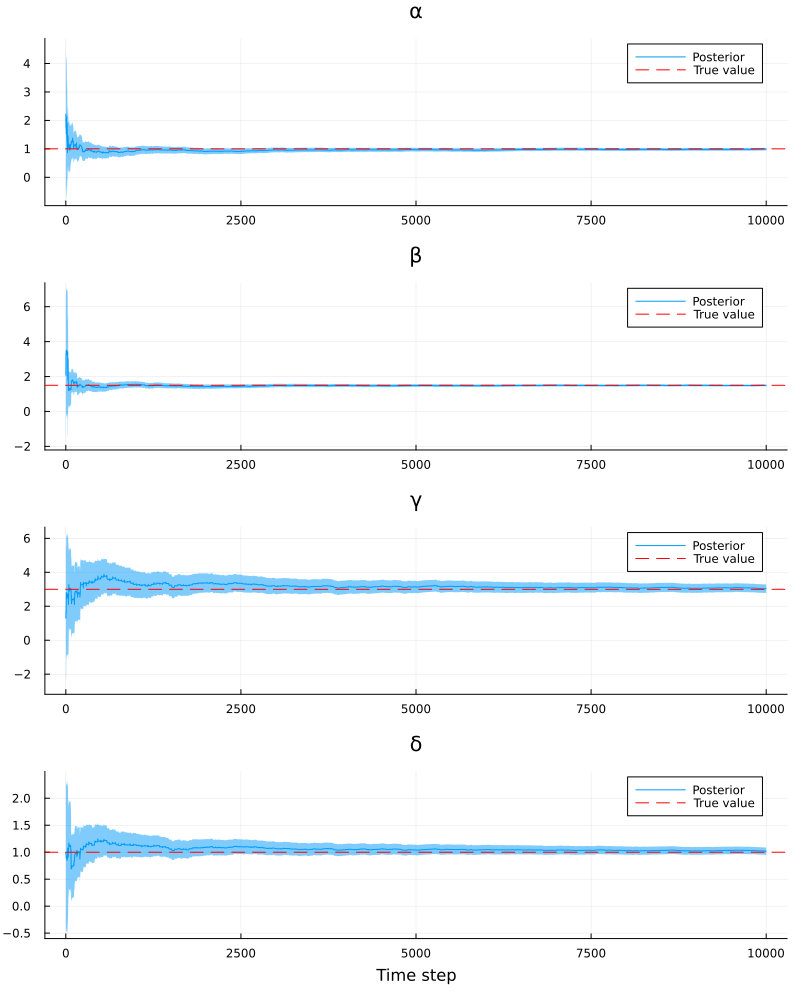


Final Parameter Estimates:
α: 0.9873125810391605 ± 0.022683193282629403
β: 1.4928568988038962 ± 0.02690070420902613
γ: 3.0329956989101547 ± 0.12553964480471533
δ: 1.019242565389995 ± 0.033832412596847175

Final Parameter Covariance Matrix:


4×4 Matrix{Float64}:
 0.000514527   0.00038494    8.38569e-5   3.78402e-5
 0.00038494    0.000723648  -8.1867e-5   -4.44924e-5
 8.38569e-5   -8.1867e-5     0.0157602    0.00373872
 3.78402e-5   -4.44924e-5    0.00373872   0.00114463

In [23]:
mθ_posterior = mean.(result.history[:θ])
Vθ_posterior = var.(result.history[:θ])

p = plot(layout=(4,1), size=(800,1000), legend=:right)

param_names = ["α", "β", "γ", "δ"]

for i in 1:4
    means = [m[i] for m in mθ_posterior]
    stds = [2sqrt(v[i]) for v in Vθ_posterior]
    
    plot!(p[i], means, ribbon=stds, label="Posterior", subplot=i)
    hline!(p[i], [true_params[i]], label="True value", linestyle=:dash, color=:red, subplot=i)
    
    title!(p[i], param_names[i], subplot=i)
    if i == 4 
        xlabel!(p[i], "Time step", subplot=i)
    end
end

# Place legend at top right for all subplots
plot!(p, legend=:topright)

display(p)
final_means = last(mθ_posterior)
final_vars = last(Vθ_posterior)
final_stds = sqrt.(final_vars)

# Print results
println("\nFinal Parameter Estimates:")
for (param, mean, std) in zip(param_names, final_means, final_stds)
    println("$param: $mean ± $(std)")
end

# Get final covariance matrix
final_cov = cov(last(result.history[:θ]))
println("\nFinal Parameter Covariance Matrix:")
display(final_cov)



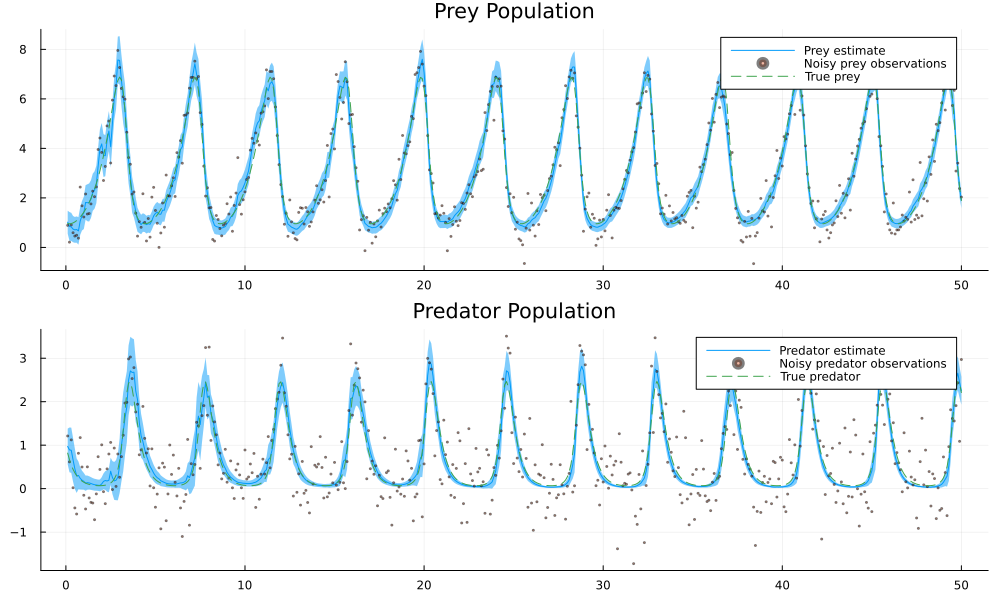

In [24]:
from = 1
skip = 1        
to = 500

# Get state estimates and variances
mx = mean.(result.history[:x])
Vx = var.(result.history[:x])

# Plot state estimates with uncertainty bands
p1 = plot(ts_long[from:skip:to] , getindex.(mx, 1)[from:skip:to], ribbon=2*sqrt.(getindex.(Vx, 1)[from:skip:to]), 
          label="Prey estimate", legend=:topright)
scatter!(p1, ts_long[from:skip:to], getindex.(noisy_data_long, 1)[from:skip:to], label="Noisy prey observations", alpha=0.5,ms=1)
plot!(p1, ts_long[from:skip:to], getindex.(data_long, 1)[from:skip:to], label="True prey", linestyle=:dash)
title!(p1, "Prey Population")

p2 = plot(ts_long[from:skip:to], getindex.(mx, 2)[from:skip:to], ribbon=2*sqrt.(getindex.(Vx, 2)[from:skip:to]), 
          label="Predator estimate", legend=:topright)
scatter!(p2, ts_long[from:skip:to], getindex.(noisy_data_long, 2)[from:skip:to], label="Noisy predator observations", alpha=0.5, ms=1)
plot!(p2, ts_long[from:skip:to], getindex.(data_long, 2)[from:skip:to] , label="True predator", linestyle=:dash)
title!(p2, "Predator Population")

plot(p1, p2, layout=(2,1), size=(1000,600))

## Third Alternative: RxInfer Model with Exponential Transformation on the Parameters
So far we have used the `exp` function to transform the parameters to the positive domain and computed free energy. This transformation was done outside of `@model` macro. In this approach, we will use the `exp` function to transform the parameters to the positive domain but within the `@model` macro. We will then use the `Unscented` method to approximate the non-linear deterministic node. This approach is more computationally efficient than the previous one, however it may suffer from accuracy issues as we may not have a good hyper-parameter initialization. 

NOTE: We can not use `exp.()` inside the `@model` macro as the model macro doesn't support broadcasting yet. So we need to define a function that will apply the `exp` function to the parameters. 


In [25]:
lotka_volterra_rk4_transformed(x,θ,t,dt) = lotka_volterra_rk4(x, exp.(θ), t, dt)## This function is used to apply the exp function to the parameters within the @model macro

@model function lotka_volterra_model2(obs, mprev, Vprev, dt, t, mθ, Vθ)
    θ     ~ MvNormalMeanCovariance(mθ, Vθ)
    xprev ~ MvNormalMeanCovariance(mprev, Vprev)
    x     := lotka_volterra_rk4_transformed(xprev, θ, t, dt)
    obs   ~ MvNormalMeanCovariance(x,  noisev * diageye(length(mprev)))
end

delta_meta2 = @meta begin
    lotka_volterra_rk4_transformed() ->  Unscented()
end

autoupdates2 = @autoupdates begin
    mprev, Vprev= mean_cov(q(x))
    mθ, Vθ = mean_cov(q(θ))
end

@initialization function initialize2(mx, Vx, mθ, Vθ)
    q(x) = MvNormalMeanCovariance(mx, Vx)
    q(θ) = MvNormalMeanCovariance(mθ, Vθ)
end


result2  = infer(
    model = lotka_volterra_model2(dt = dt,),
    data = (obs = noisy_data_long, t= ts_long),
    initialization = initialize2(ones(2),  1e-6diageye(2), zeros(4), 0.1*diageye(4)),
    meta = delta_meta2,
    autoupdates = autoupdates2,
    keephistory = length(noisy_data_long),
    free_energy = true
)


RxInferenceEngine:
  Posteriors stream    | enabled for (θ, xprev, x)
  Free Energy stream   | enabled
  Posteriors history   | available for (θ, xprev, x)
  Free Energy history  | available
  Enabled events       | [  ]

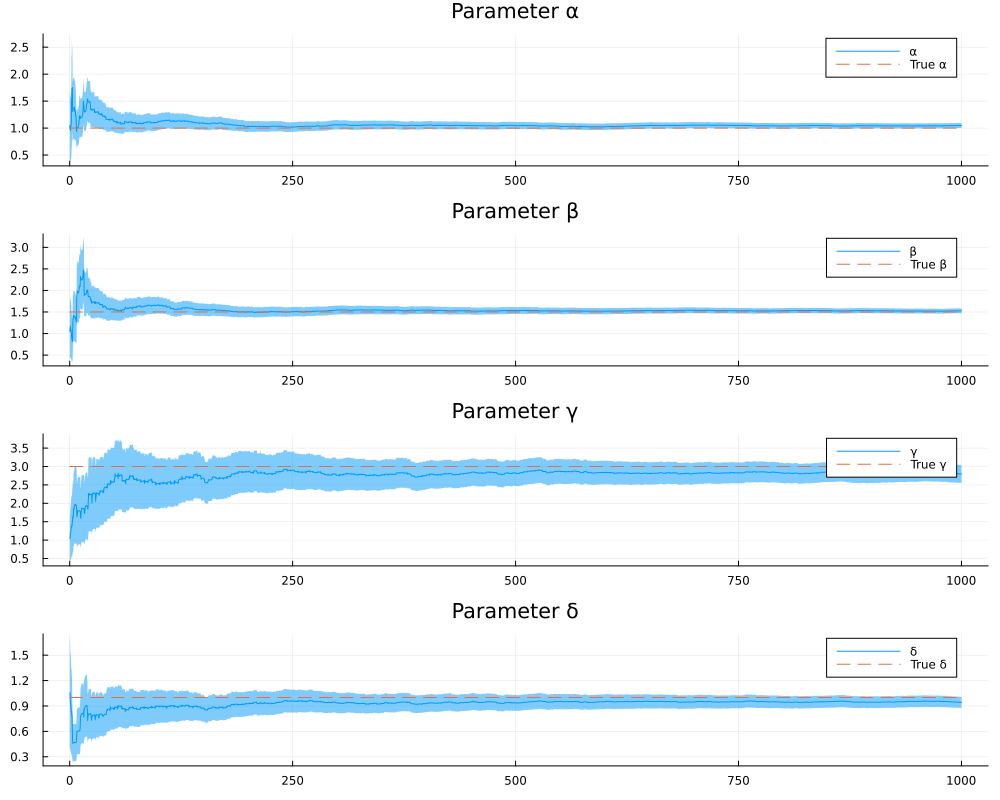

In [26]:
mθ =  mean.(result2.history[:θ])
Vθ = cov.(result2.history[:θ])
expf(θ) = exp.(θ)
θdists = map((m,v) -> MvNormalMeanCovariance(m, v), mθ, Vθ)
θ_exp_dists = map(θdist -> ReactiveMP.approximate(Unscented(), expf, (θdist,)), θdists)

mθ_exp =  mean.(θ_exp_dists)
Vθ_exp = cov.(θ_exp_dists)

# Plot the inferred parameters with uncertainty
p1 = plot(ts_long, getindex.(mθ_exp, 1), ribbon=2*sqrt.(getindex.(Vθ_exp, 1,1)), label="α", legend=:topright)
plot!(p1, ts_long, fill(true_params[1], length(ts_long)), label="True α", linestyle=:dash)
title!(p1, "Parameter α")

p2 = plot(ts_long, getindex.(mθ_exp, 2), ribbon=2*sqrt.(getindex.(Vθ_exp, 2,2)), label="β", legend=:topright)
plot!(p2, ts_long, fill(true_params[2], length(ts_long)), label="True β", linestyle=:dash)
title!(p2, "Parameter β")

p3 = plot(ts_long, getindex.(mθ_exp, 3), ribbon=2*sqrt.(getindex.(Vθ_exp, 3,3)), label="γ", legend=:topright)
plot!(p3, ts_long, fill(true_params[3], length(ts_long)), label="True γ", linestyle=:dash)
title!(p3, "Parameter γ")

p4 = plot(ts_long, getindex.(mθ_exp, 4), ribbon=2*sqrt.(getindex.(Vθ_exp, 4,4)), label="δ", legend=:topright)
plot!(p4, ts_long, fill(true_params[4], length(ts_long)), label="True δ", linestyle=:dash)
title!(p4, "Parameter δ")

plot(p1, p2, p3, p4, layout=(4,1), size=(1000,800))


In [27]:
# Print final parameter estimates and covariance
final_means = last(mθ_exp)
final_vars = diag(last(Vθ_exp))
final_stds = sqrt.(final_vars)

# Print results
println("\nFinal Parameter Estimates:")
for (param, mean, std) in zip(param_names, final_means, final_stds)
    println("$param: $mean ± $(std)")
end

println("\nFinal parameter covariance matrix:")
display(last(Vθ_exp))

4×4 Matrix{Float64}:
 0.000554692   0.000437206   8.94158e-5   3.93331e-5
 0.000437206   0.000766326  -7.64945e-5  -5.57011e-5
 8.94158e-5   -7.64945e-5    0.0147644    0.00347717
 3.93331e-5   -5.57011e-5    0.00347717   0.00107983


Final Parameter Estimates:
α: 1.0466420646116603 ± 0.023551898986693683
β: 1.5267272961209528 ± 0.027682602677811006
γ: 2.796108595561236 ± 0.12150864746672682
δ: 0.9428781818569405 ± 0.03286083593438435

Final parameter covariance matrix:


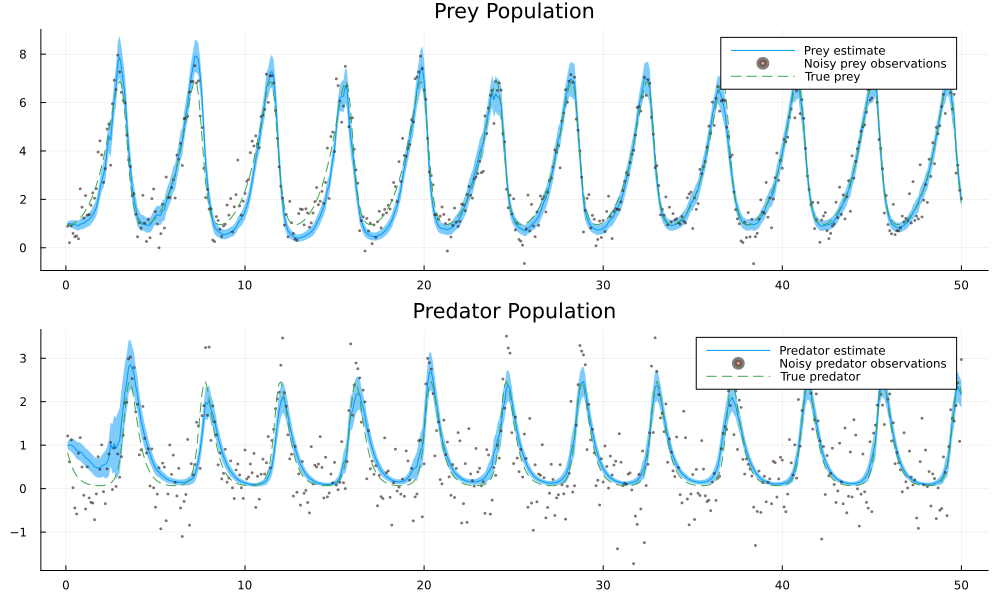

In [28]:

# Get state estimates and variances
mx = mean.(result2.history[:x])
Vx = var.(result2.history[:x])

# Plot state estimates with uncertainty bands
p1 = plot(ts_long[from:skip:to] , getindex.(mx, 1)[from:skip:to], ribbon=2*sqrt.(getindex.(Vx, 1)[from:skip:to]), 
          label="Prey estimate", legend=:topright)
scatter!(p1, ts_long[from:skip:to], getindex.(noisy_data_long, 1)[from:skip:to], label="Noisy prey observations", alpha=0.5,ms=1)
plot!(p1, ts_long[from:skip:to], getindex.(data_long, 1)[from:skip:to], label="True prey", linestyle=:dash)
title!(p1, "Prey Population")

p2 = plot(ts_long[from:skip:to], getindex.(mx, 2)[from:skip:to], ribbon=2*sqrt.(getindex.(Vx, 2)[from:skip:to]), 
          label="Predator estimate", legend=:topright)
scatter!(p2, ts_long[from:skip:to], getindex.(noisy_data_long, 2)[from:skip:to], label="Noisy predator observations", alpha=0.5, ms=1)
plot!(p2, ts_long[from:skip:to], getindex.(data_long, 2)[from:skip:to] , label="True predator", linestyle=:dash)
title!(p2, "Predator Population")

plot(p1, p2, layout=(2,1), size=(1000,600))
